# Keras モデルを作る．

In [9]:
#31
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten, Conv1D, Conv2D, MaxPooling2D, BatchNormalization, GlobalAveragePooling2D, Dropout
from tensorflow.keras.utils import to_categorical
import numpy as np
import tensorflow as tf
from tensorflow.keras.datasets import mnist, cifar10
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model
import datetime

from tensorflow.keras.callbacks import EarlyStopping

#for tentsorboard
import tensorflow.keras.callbacks
#import tensorflow.keras.backend.tensorflow_backend as KTF
import tensorflow.keras.backend as KTF
import tensorflow as tf

#Vurnum = 実験番号
Vernum = 96

import os

In [10]:
#1
import re
import numpy as np
import glob
import random
import matplotlib.pyplot as plt

import pandas as pd
from urllib.request import urlopen
from lxml import etree

import matplotlib as mpl

In [16]:
#loding ndarray
print(type(np.load('../saving_numpy_array/v8-16/x_train/all/x_train_all_v8-16.npy')))
print(np.load('../saving_numpy_array/v8-16/x_train/all/x_train_all_v8-16.npy'))

x_train_all = np.load('../saving_numpy_array/v8-16/x_train/all/x_train_all_v8-16.npy')
y_train_all = np.load('../saving_numpy_array/v8-16/x_train/all/y_train_all_v8-16.npy')
x_train_all_5crossval = np.load('../saving_numpy_array/v8-16/x_train/all/x_train_all_5crossval_v8-16.npy')
y_train_all_5crossval = np.load('../saving_numpy_array/v8-16/x_train/all/y_train_all_5crossval_v8-16.npy')
#y_train_all_5crossval_v8-1_only_positive

x_train_positive_all_5crossval = np.load('../saving_numpy_array/v8-16/x_train/all/x_train_positive_all_5crossval_v8-16.npy')
x_train_negative_all_5crossval = np.load('../saving_numpy_array/v8-16/x_train/all/x_train_negative_all_5crossval_v8-16.npy')
len(x_train_positive_all_5crossval)
len(x_train_negative_all_5crossval)

<class 'numpy.ndarray'>
[[[[ 0.000000e+00]
   [-7.358760e-02]
   [ 0.000000e+00]
   ...
   [-1.995000e-04]
   [ 5.935090e-02]
   [ 0.000000e+00]]

  [[-3.838254e-01]
   [-2.554557e-01]
   [-8.600770e-02]
   ...
   [ 5.738126e-01]
   [-7.869063e-01]
   [ 7.227214e-01]]

  [[ 0.000000e+00]
   [ 0.000000e+00]
   [ 0.000000e+00]
   ...
   [ 0.000000e+00]
   [ 0.000000e+00]
   [ 0.000000e+00]]

  ...

  [[ 1.000000e+00]
   [ 1.000000e+00]
   [ 1.000000e+00]
   ...
   [ 1.000000e+00]
   [ 3.000000e+00]
   [ 1.000000e+00]]

  [[ 3.000000e+00]
   [ 2.000000e+00]
   [ 2.000000e+00]
   ...
   [ 3.000000e+00]
   [ 2.000000e+00]
   [ 2.000000e+00]]

  [[ 0.000000e+00]
   [ 1.000000e+00]
   [ 0.000000e+00]
   ...
   [ 0.000000e+00]
   [ 0.000000e+00]
   [ 1.000000e+00]]]


 [[[ 0.000000e+00]
   [-9.987427e-01]
   [ 0.000000e+00]
   ...
   [ 0.000000e+00]
   [ 0.000000e+00]
   [ 0.000000e+00]]

  [[ 0.000000e+00]
   [-7.458280e-01]
   [ 7.227214e-01]
   ...
   [ 1.630295e-01]
   [-2.554557e-01]
   [

38

In [17]:
print(len(x_train_all))
print(len(y_train_all))
print(len(x_train_all_5crossval))
print(len(y_train_all_5crossval))

317
317
78
78


# Searching parameters by grid search like depth-first search

```
存在するパラメータの種類は，CNNを使う際はKernel, Conv2D layer, Pooling layer, hidden layer, Batch size, epochsの6種類が考えられる．
NN Full connectionの場合は，hidden layer, Batch size, epochsの3種類を考える．

CNNでは，Kernel(14x3, 14x4, 14x5, 14x6, 14x7)まであり，各畳み込み層には6, 5, 4, 3, 2個のニューロンが生じる．
Poolin layerは今回は出力後のニューロンが少ないため必要ない．
```

## CNNのKernel幅等を変えて試す．

In [41]:
Vernum = 96

In [43]:
# DFS for parameters in test case.
#訓練データ
x_train = x_train_all
y_train = y_train_all

#検証データ
x_val = x_train_all_5crossval 
y_val = y_train_all_5crossval 


#old_session = KTF.get_session()
#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)
#960 patterns, 当初は768 patterns
num = 0
for i in [3, 4, 5, 6]:
    for j in [3, 5, 10, 16]:
        for k in [3, 5, 10, 16]: 
            for m in [32, 64, 128]:
                for n in [10, 50, 100, 200, 300]: 
                    #modelの定義の前に重みのリセットが必要で，これ？
                    tf.compat.v1.Session()
                    #sess = tf.compat.v1.Session()
                    #モデル構築
                    model = Sequential()
                    model.add(Conv2D(filters=j, kernel_size=(14, i), strides=(1, 1), padding='valid', 
                                     data_format="channels_last", dilation_rate=(1, 1), activation='relu', 
                                     use_bias=True, input_shape=(14, 8, 1), kernel_initializer='glorot_uniform', 
                                     bias_initializer='zeros',  name='Conv2D_01'))
                    #model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None, 
                    #                       name='MaxPooling2D_01'))
                    model.add(Flatten(name='Flatten_01'))
                    #model.add(Dropout(0.50))
                    model.add(Dense(units=k, name='Denese_01', activation='relu'))
                    #model.add(Dense(units=50, name='Dense_01', activation='relu')
                    #model.add(Dense(units=10, name='Denese_03', activation='relu'))
                    model.add(Dense(units=2, name='Dense_out'))
                    model.add(Activation('softmax'))

                    #モデルの構造を表示
                    model.summary()

                    #訓練（学習）プロセスの設定
                    model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])



                    #バリデーションロスが減少した場合に，各エポック終了後，モデルの重みを保存します
                    #checkpointer = ModelCheckpoint(filepath='./weights.hdf5', verbose=0, save_best_only=True, save_format="h5")
                    ### add for TensorBoard
                    erly_stpg = EarlyStopping(patience=10, verbose=1,monitor='val_loss' , mode = 'min') 
                    chkfile = '../callbacks/' + '{0:2d}'.format(Vernum)+'_{epoch:02d}-{val_loss:.4f}.hdf5' #format関数
                    check_point = ModelCheckpoint(filepath = chkfile, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
                    check_point = [check_point]

                    log_dir = "log03/" + datetime.datetime.now().strftime(f"%Y%m%d-%H%M%S_num{num}")
                    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
                    cbks=[tensorboard_callback]

                    #訓練の実行 
                    NUM_BATCH=m
                    NUM_EPOCHS=n
                    #history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, validation_split=0.2, shuffle = True ,
                    #                    callbacks=[erly_stpg , chck_pont], verbose = 0, )
                    history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, 
                                         shuffle = True, verbose = 0,
                                        callbacks=check_point,
                                       validation_data=(x_val, y_val))


                    #saving the model.you can use the
                    save_dir = "../model_saving/DFS_parameter/CNN/"
                    model_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S"+f"_num{num}")
                    if not os.path.isdir(save_dir):
                        os.makedirs(save_dir)
                    model_path = os.path.join(save_dir, model_name)
                    model.save(model_path)
                    print(f'Saved trained model at %s num:{num})' % model_path)

                    df1 = pd.DataFrame(
                        data={'loss':history.history['loss'], 
                              'acc':history.history['acc'],
                              'val_loss':history.history['val_loss'], 
                              'val_acc':history.history['val_acc']
                             }, 
                        index=np.arange(0, NUM_EPOCHS)
                    )

                    df1

                    df2 = pd.DataFrame(
                        data={'Kernel':f'14x{i}',
                             'Conv2D':str(j),
                             'hidden01':str(k),
                             'epochs':str(m),
                             'Batch_size':str(n)}, 
                        index=np.arange(4)
                    )
                    df2
                    print(pd.concat([df1, df2], axis=1))
                    df3 = pd.concat([df1, df2], axis=1)
                    print(f'num: {num}')
                    filename = f'../fitting_model/DFS_parameters/CNN/trial_num{num}_i{i}_j{j}_k{k}_m{m}_n{n}.csv'
                    df3.to_csv(filename)
                    print(filename)
                    
                    print(f'{num} calculation ends.')
                    print(f'i: {i}')
                    print(f'j: {j}')
                    print(f'k: {k}')
                    print(f'm: {m}')
                    print(f'n: {n}')
                    
                    num = num + 1
                    print("----------------------------------------------------")
#print(type(history))
#print(type(history.history))
#print(history.history.keys())
#print(history.history['loss'])
#print(history.history['acc'])
#print(history.history['val_loss'])
#print(history.history['val_acc'])
print("END")

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv2D_01 (Conv2D)           (None, 1, 6, 3)           129       
_________________________________________________________________
Flatten_01 (Flatten)         (None, 18)                0         
_________________________________________________________________
Denese_01 (Dense)            (None, 3)                 57        
_________________________________________________________________
Dense_out (Dense)            (None, 2)                 8         
_________________________________________________________________
activation_1 (Activation)    (None, 2)                 0         
Total params: 194
Trainable params: 194
Non-trainable params: 0
_________________________________________________________________

Epoch 00001: val_loss improved from inf to 0.50174, saving model to ../callbacks/96_01-0.5017.hdf5

Epoch 00002: val_loss

```
Epoch 00200: val_loss did not improve from 0.25108
Saved trained model at ../model_saving/DFS_parameter/20220729-184828(num:111) (num:111)
```

In [2]:
model = load_model("./model_saving/20220729-184828(num:111) (num:111)")

NameError: name 'load_model' is not defined

In [ ]:
model.summary()

In [ ]:
df1 = pd.DataFrame(
    data={'loss':history.history['loss'], 
          'acc':history.history['acc'],
          'val_loss':history.history['val_loss'], 
          'val_acc':history.history['val_acc']
         }, 
    index=np.arange(0, n)
)
 
df1

In [ ]:
df2 = pd.DataFrame(
    data={'Kernel':f'14x{i}',
         'Conv2D':str(j),
         'hidden01':str(k),
         'Batch_size':str(m),
         'epochs':str(n)}, 
    index=np.arange(4)
)
df2

In [ ]:
print(pd.concat([df1, df2], axis=1))
df3 = pd.concat([df1, df2], axis=1)

In [ ]:
var = "CNN_various_04"
filename = f'../fitting_model/FCvsCNN/CNN/trial_{var}.csv'
df3.to_csv(filename)

In [ ]:
df3.iloc[n-5:n, :]

In [ ]:
plt.plot(range(1, NUM_EPOCHS+1), df3['acc'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), df3['val_acc'], "-o")
plt.title('model accuracy')
plt.ylabel('accuracy')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['acc', 'val_acc'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
plt.ylim(0.0,1.0)
plt.show()

In [ ]:
plt.plot(range(1, NUM_EPOCHS+1), df3['loss'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), df3['val_loss'], "-o")
plt.title('model loss')
plt.ylabel('loss')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['loss', 'val_loss'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
plt.ylim(0.0,1.0)
plt.show()

In [ ]:
loss, acc = model.evaluate(x_val, y_val)
print(f"Test Loss: {loss*100}%")
print(f"Test Acc: {acc*100}%")

In [ ]:
#saving the model.
save_dir = "../model_saving/"
model_name = datetime.datetime.now().strftime(f"%Y%m%d-%H%M%S_{Vernum}")
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
model_path = os.path.join(save_dir, model_name)
model.save(model_path)
print('Saved trained model at %s ' % model_path)

In [17]:
#back up01
# DFS for parameters in test case.
#訓練データ
x_train = x_train_all
y_train = y_train_all

#検証データ
x_val = x_train_all_5crossval 
y_val = y_train_all_5crossval 


#old_session = KTF.get_session()
#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)
num = 0
for i in [3, 4, 5, 6]:
    for j in [3, 5, 10, 16]:
        for k in [3, 5, 10, 16]: 
            for m in [10, 100, 200, 300]:
                for n in [32, 64, 128]:
                    #modelの定義の前に重みのリセットが必要で，これ？
                    tf.compat.v1.Session()
                    #sess = tf.compat.v1.Session()
                    #モデル構築
                    model = Sequential()
                    model.add(Conv2D(filters=j, kernel_size=(14, i), strides=(1, 1), padding='valid', 
                                     data_format="channels_last", dilation_rate=(1, 1), activation='relu', 
                                     use_bias=True, input_shape=(14, 8, 1), kernel_initializer='glorot_uniform', 
                                     bias_initializer='zeros',  name='Conv2D_01'))
                    #model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None, 
                    #                       name='MaxPooling2D_01'))
                    model.add(Flatten(name='Flatten_01'))
                    #model.add(Dropout(0.50))
                    model.add(Dense(units=k, name='Denese_01', activation='relu'))
                    #model.add(Dense(units=50, name='Dense_01', activation='relu')
                    #model.add(Dense(units=10, name='Denese_03', activation='relu'))
                    model.add(Dense(units=2, name='Dense_out'))
                    model.add(Activation('softmax'))

                    #モデルの構造を表示
                    model.summary()

                    #訓練（学習）プロセスの設定
                    model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])



                    #バリデーションロスが減少した場合に，各エポック終了後，モデルの重みを保存します
                    #checkpointer = ModelCheckpoint(filepath='./weights.hdf5', verbose=0, save_best_only=True, save_format="h5")
                    ### add for TensorBoard
                    erly_stpg = EarlyStopping(patience=10, verbose=1,monitor='val_loss' , mode = 'min') 
                    chkfile = './callbacks/' + '{0:2d}'.format(Vernum)+'_{epoch:02d}-{val_loss:.4f}.hdf5' #format関数
                    check_point = ModelCheckpoint(filepath = chkfile, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
                    check_point = [check_point]

                    log_dir = "log03/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
                    cbks=[tensorboard_callback]

                    #訓練の実行 
                    NUM_EPOCHS=m
                    NUM_BATCH=n
                    #history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, validation_split=0.2, shuffle = True ,
                    #                    callbacks=[erly_stpg , chck_pont], verbose = 0, )
                    history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, 
                                         shuffle = True, verbose = 0,
                                        callbacks=check_point,
                                       validation_data=(x_val, y_val))


                    #saving the model.you can use the
                    save_dir = "../model_saving/DFS_parameter/"
                    model_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S"+f"_num{num}_i{i}_j{j}_k{k}")
                    if not os.path.isdir(save_dir):
                        os.makedirs(save_dir)
                    model_path = os.path.join(save_dir, model_name)
                    model.save(model_path)
                    print(f'Saved trained model at %s (num:{num})' % model_path)

                    df1 = pd.DataFrame(
                        data={'loss':history.history['loss'], 
                              'acc':history.history['acc'],
                              'val_loss':history.history['val_loss'], 
                              'val_acc':history.history['val_acc']
                             }, 
                        index=np.arange(0, NUM_EPOCHS)
                    )

                    df1

                    df2 = pd.DataFrame(
                        data={'Kernel':f'14x{i}',
                             'Conv2D':str(j),
                             'hidden01':str(k),
                             'epochs':str(m),
                             'Batch_size':str(n)}, 
                        index=np.arange(4)
                    )
                    df2
                    print(pd.concat([df1, df2], axis=1))
                    df3 = pd.concat([df1, df2], axis=1)
                    print(f'num: {num}')
                    filename = f'../predict/DFS_parameter/trial_{num}.csv'
                    df3.to_csv(filename)
                    
                    print(f'{num} calculation ends.')
                    print(f'i: {i}')
                    print(f'j: {j}')
                    print(f'k: {k}')
                    print(f'm: {m}')
                    print(f'n: {n}')
                    
                    num = num + 1
                    print("----------------------------------------------------")
#print(type(history))
#print(type(history.history))
#print(history.history.keys())
#print(history.history['loss'])
#print(history.history['acc'])
#print(history.history['val_loss'])
#print(history.history['val_acc'])
print("END")

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv2D_01 (Conv2D)           (None, 1, 7, 3)           87        
_________________________________________________________________
Flatten_01 (Flatten)         (None, 21)                0         
_________________________________________________________________
Denese_01 (Dense)            (None, 0)                 0         
_________________________________________________________________
Dense_out (Dense)            (None, 2)                 2         
_________________________________________________________________
activation_4 (Activation)    (None, 2)                 0         
Total params: 89
Trainable params: 89
Non-trainable params: 0
_________________________________________________________________

Epoch 00001: val_loss improved from inf to 0.69315, saving model to ./callbacks/89_01-0.6931.hdf5


OSError: Unable to create file (unable to open file: name = './callbacks/89_01-0.6931.hdf5', errno = 2, error message = 'No such file or directory', flags = 13, o_flags = 242)

# 次再学習する時はコチラを使う．

In [ ]:
# DFS for parameters in test case.
#訓練データ
x_train = x_train_all
y_train = y_train_all

#検証データ
x_val = x_train_all_5crossval 
y_val = y_train_all_5crossval 


#old_session = KTF.get_session()
#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)
#960 patterns, 当初は768 patterns
num = 0
for n in [10, 50, 100, 200, 300]:
    for j in [3, 5, 10, 16]:
        for k in [3, 5, 10, 16]: 
            for m in [32, 64, 128]:
                for i in [3, 4, 5, 6]: 
                    #modelの定義の前に重みのリセットが必要で，これ？
                    tf.compat.v1.Session()
                    #sess = tf.compat.v1.Session()
                    #モデル構築
                    model = Sequential()
                    model.add(Conv2D(filters=j, kernel_size=(14, i), strides=(1, 1), padding='valid', 
                                     data_format="channels_last", dilation_rate=(1, 1), activation='relu', 
                                     use_bias=True, input_shape=(14, 8, 1), kernel_initializer='glorot_uniform', 
                                     bias_initializer='zeros',  name='Conv2D_01'))
                    #model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None, 
                    #                       name='MaxPooling2D_01'))
                    model.add(Flatten(name='Flatten_01'))
                    #model.add(Dropout(0.50))
                    model.add(Dense(units=k, name='Denese_01', activation='relu'))
                    #model.add(Dense(units=50, name='Dense_01', activation='relu')
                    #model.add(Dense(units=10, name='Denese_03', activation='relu'))
                    model.add(Dense(units=2, name='Dense_out'))
                    model.add(Activation('softmax'))

                    #モデルの構造を表示
                    model.summary()

                    #訓練（学習）プロセスの設定
                    model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])



                    #バリデーションロスが減少した場合に，各エポック終了後，モデルの重みを保存します
                    #checkpointer = ModelCheckpoint(filepath='./weights.hdf5', verbose=0, save_best_only=True, save_format="h5")
                    ### add for TensorBoard
                    erly_stpg = EarlyStopping(patience=10, verbose=1,monitor='val_loss' , mode = 'min') 
                    chkfile = '../callbacks/' + '{0:2d}'.format(Vernum)+'_{epoch:02d}-{val_loss:.4f}.hdf5' #format関数
                    check_point = ModelCheckpoint(filepath = chkfile, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
                    check_point = [check_point]

                    log_dir = "log03/" + datetime.datetime.now().strftime(f"%Y%m%d-%H%M%S_num{num}")
                    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
                    cbks=[tensorboard_callback]

                    #訓練の実行 
                    NUM_BATCH=m
                    NUM_EPOCHS=n
                    #history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, validation_split=0.2, shuffle = True ,
                    #                    callbacks=[erly_stpg , chck_pont], verbose = 0, )
                    history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, 
                                         shuffle = True, verbose = 0,
                                        callbacks=check_point,
                                       validation_data=(x_val, y_val))


                    #saving the model.you can use the
                    save_dir = "../model_saving/DFS_parameter/CNN/"
                    model_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S"+f"_num{num}")
                    if not os.path.isdir(save_dir):
                        os.makedirs(save_dir)
                    model_path = os.path.join(save_dir, model_name)
                    model.save(model_path)
                    print(f'Saved trained model at %s (num:{num})' % model_path)

                    df1 = pd.DataFrame(
                        data={'loss':history.history['loss'], 
                              'acc':history.history['acc'],
                              'val_loss':history.history['val_loss'], 
                              'val_acc':history.history['val_acc']
                             }, 
                        index=np.arange(0, NUM_EPOCHS)
                    )

                    df1

                    df2 = pd.DataFrame(
                        data={'Kernel':f'14x{i}',
                             'Conv2D':str(j),
                             'hidden01':str(k),
                             'epochs':str(m),
                             'Batch_size':str(n)}, 
                        index=np.arange(4)
                    )
                    df2
                    print(pd.concat([df1, df2], axis=1))
                    df3 = pd.concat([df1, df2], axis=1)
                    print(f'num: {num}')
                    filename = f'../fitting_model/DFS_parameters/CNN/trial_num{num}_i{i}_j{j}_k{k}_m{m}_n{n}.csv'
                    df3.to_csv(filename)
                    print(filename)
                    
                    print(f'{num} calculation ends.')
                    print(f'i: {i}')
                    print(f'j: {j}')
                    print(f'k: {k}')
                    print(f'm: {m}')
                    print(f'n: {n}')
                    
                    num = num + 1
                    print("----------------------------------------------------")
#print(type(history))
#print(type(history.history))
#print(history.history.keys())
#print(history.history['loss'])
#print(history.history['acc'])
#print(history.history['val_loss'])
#print(history.history['val_acc'])
print("END")

In [ ]:
'''
パラメータが３８万通り以上で動かなくなった．
# DFS for parameters
#訓練データ
x_train = x_train_all
y_train = y_train_all

#検証データ
x_val = x_train_all_5crossval 
y_val = y_train_all_5crossval 


#old_session = KTF.get_session()
#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)
num = 0
for i in range(8):
    for j in range(3, 16):
        for k in range(3, 64): 
            for m in [5, 8, 16, 32, 64, 128, 256, 300, 326, 512]:
                for n in [4, 8, 16, 32, 64, 128]:
                    #モデル構築
                    model = Sequential()
                    model.add(Conv2D(filters=j, kernel_size=(14, i), strides=(1, 1), padding='valid', 
                                     data_format="channels_last", dilation_rate=(1, 1), activation='relu', 
                                     use_bias=True, input_shape=(14, 8, 1), kernel_initializer='glorot_uniform', 
                                     bias_initializer='zeros',  name='Conv2D_01'))
                    #model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None, 
                    #                       name='MaxPooling2D_01'))
                    model.add(Flatten(name='Flatten_01'))
                    #model.add(Dropout(0.50))
                    model.add(Dense(units=k, name='Denese_01', activation='relu'))
                    #model.add(Dense(units=50, name='Dense_01', activation='relu')
                    #model.add(Dense(units=10, name='Denese_03', activation='relu'))
                    model.add(Dense(units=2, name='Dense_out'))
                    model.add(Activation('softmax'))

                    #モデルの構造を表示
                    model.summary()

                    #訓練（学習）プロセスの設定
                    model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])



                    #バリデーションロスが減少した場合に，各エポック終了後，モデルの重みを保存します
                    #checkpointer = ModelCheckpoint(filepath='./weights.hdf5', verbose=0, save_best_only=True, save_format="h5")
                    ### add for TensorBoard
                    erly_stpg = EarlyStopping(patience=10, verbose=1,monitor='val_loss' , mode = 'min') 
                    chkfile = './callbacks/' + '{0:2d}'.format(Vernum)+'_{epoch:02d}-{val_loss:.4f}.hdf5' #format関数
                    check_point = ModelCheckpoint(filepath = chkfile, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
                    check_point = [check_point]

                    log_dir = "log03/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
                    cbks=[tensorboard_callback]

                    #訓練の実行 
                    NUM_EPOCHS=m
                    NUM_BATCH=n
                    #history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, validation_split=0.2, shuffle = True ,
                    #                    callbacks=[erly_stpg , chck_pont], verbose = 0, )
                    history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, 
                                        validation_split=0.2, shuffle = True, verbose = 0,
                                        callbacks=check_point,
                                       validation_data=(x_val, y_val))


                    #saving the model.you can use the
                    save_dir = "./model_saving/DFS_parameter/"
                    model_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S"+f"(num:{num})")
                    if not os.path.isdir(save_dir):
                        os.makedirs(save_dir)
                    model_path = os.path.join(save_dir, model_name)
                    model.save(model_path)
                    print(f'Saved trained model at %s (num:{num})' % model_path)

                    df1 = pd.DataFrame(
                        data={'loss':history.history['loss'], 
                              'acc':history.history['acc'],
                              'val_loss':history.history['val_loss'], 
                              'val_acc':history.history['val_acc']
                             }, 
                        index=np.arange(0, NUM_EPOCHS)
                    )

                    df1

                    df2 = pd.DataFrame(
                        data={'Kernel':f'14x{i}',
                             'Conv2D':str(j),
                             'hidden01':str(k),
                             'Batch_size':str(m),
                             'epochs':str(n)}, 
                        index=np.arange(4)
                    )
                    df2
                    print(pd.concat([df1, df2], axis=1))
                    pd3 = pd.concat([df1, df2], axis=1)
                    filename = f'./predict/DFS_parameter/trial_{num}.csv'
                    df3.to_csv(filename)
                    num = num + 1
                    print(f'{num} calculation ends.')
                    print(f'i: {i}')
                    print(f'j: {j}')
                    print(f'k: {k}')
                    print(f'm: {m}')
                    print(f'n: {n}')
#print(type(history))
#print(type(history.history))
#print(history.history.keys())
#print(history.history['loss'])
#print(history.history['acc'])
#print(history.history['val_loss'])
#print(history.history['val_acc'])

## 小さい空間でテスト

In [ ]:
'''
# DFS for parameters in test case.
#訓練データ
x_train = x_train_all
y_train = y_train_all

#検証データ
x_val = x_train_all_5crossval 
y_val = y_train_all_5crossval 


#old_session = KTF.get_session()
#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)
num = 0
for i in [2, 3]:
    for j in [3, 5]:
        for k in [3, 5]: 
            for m in [5, 8]:
                for n in [4, 8]:
                    #モデル構築
                    model = Sequential()
                    model.add(Conv2D(filters=j, kernel_size=(14, i), strides=(1, 1), padding='valid', 
                                     data_format="channels_last", dilation_rate=(1, 1), activation='relu', 
                                     use_bias=True, input_shape=(14, 8, 1), kernel_initializer='glorot_uniform', 
                                     bias_initializer='zeros',  name='Conv2D_01'))
                    #model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None, 
                    #                       name='MaxPooling2D_01'))
                    model.add(Flatten(name='Flatten_01'))
                    #model.add(Dropout(0.50))
                    model.add(Dense(units=k, name='Denese_01', activation='relu'))
                    #model.add(Dense(units=50, name='Dense_01', activation='relu')
                    #model.add(Dense(units=10, name='Denese_03', activation='relu'))
                    model.add(Dense(units=2, name='Dense_out'))
                    model.add(Activation('softmax'))

                    #モデルの構造を表示
                    model.summary()

                    #訓練（学習）プロセスの設定
                    model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])



                    #バリデーションロスが減少した場合に，各エポック終了後，モデルの重みを保存します
                    #checkpointer = ModelCheckpoint(filepath='./weights.hdf5', verbose=0, save_best_only=True, save_format="h5")
                    ### add for TensorBoard
                    erly_stpg = EarlyStopping(patience=10, verbose=1,monitor='val_loss' , mode = 'min') 
                    chkfile = './callbacks/' + '{0:2d}'.format(Vernum)+'_{epoch:02d}-{val_loss:.4f}.hdf5' #format関数
                    check_point = ModelCheckpoint(filepath = chkfile, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
                    check_point = [check_point]

                    log_dir = "log03/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
                    cbks=[tensorboard_callback]

                    #訓練の実行 
                    NUM_EPOCHS=m
                    NUM_BATCH=n
                    #history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, validation_split=0.2, shuffle = True ,
                    #                    callbacks=[erly_stpg , chck_pont], verbose = 0, )
                    history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, 
                                        validation_split=0.2, shuffle = True, verbose = 0,
                                        callbacks=check_point,
                                       validation_data=(x_val, y_val))


                    #saving the model.you can use the
                    save_dir = "./model_saving/DFS_parameter/"
                    model_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S"+f"(num:{num})")
                    if not os.path.isdir(save_dir):
                        os.makedirs(save_dir)
                    model_path = os.path.join(save_dir, model_name)
                    model.save(model_path)
                    print(f'Saved trained model at %s (num:{num})' % model_path)

                    df1 = pd.DataFrame(
                        data={'loss':history.history['loss'], 
                              'acc':history.history['acc'],
                              'val_loss':history.history['val_loss'], 
                              'val_acc':history.history['val_acc']
                             }, 
                        index=np.arange(0, NUM_EPOCHS)
                    )

                    df1

                    df2 = pd.DataFrame(
                        data={'Kernel':f'14x{i}',
                             'Conv2D':str(j),
                             'hidden01':str(k),
                             'Batch_size':str(m),
                             'epochs':str(n)}, 
                        index=np.arange(4)
                    )
                    df2
                    print(pd.concat([df1, df2], axis=1))
                    df3 = pd.concat([df1, df2], axis=1)
                    filename = f'./predict/DFS_parameter/trial_{num}.csv'
                    df3.to_csv(filename)
                    num = num + 1
                    
                    print(f'{num} calculation ends.')
                    print(f'i: {i}')
                    print(f'j: {j}')
                    print(f'k: {k}')
                    print(f'm: {m}')
                    print(f'n: {n}')
#print(type(history))
#print(type(history.history))
#print(history.history.keys())
#print(history.history['loss'])
#print(history.history['acc'])
#print(history.history['val_loss'])
#print(history.history['val_acc'])

## FCで隠れ層を増やして試す．

In [ ]:
Vernum = 98

In [22]:
# DFS for parameters in test case.
#訓練データ
x_train = x_train_all
y_train = y_train_all

#検証データ
x_val = x_train_all_5crossval 
y_val = y_train_all_5crossval 


#old_session = KTF.get_session()
#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)
num = 0
i = 8 #これを固定するとFCになる．

#240 patterns
for n in [10, 50, 100, 200, 300]:
    for j in [3, 5, 10, 16]: 
        for k in [3, 5, 10, 16]: 
            for m in [32, 64, 128]:
                #モデル構築
                model = Sequential()
                model.add(Conv2D(filters=j, kernel_size=(14, i), strides=(1, 1), padding='valid', 
                                 data_format="channels_last", dilation_rate=(1, 1), activation='relu', 
                                 use_bias=True, input_shape=(14, 8, 1), kernel_initializer='glorot_uniform', 
                                 bias_initializer='zeros',  name='Conv2D_01'))
                #model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None, 
                #                       name='MaxPooling2D_01'))
                model.add(Flatten(name='Flatten_01'))
                #model.add(Dropout(0.50))
                model.add(Dense(units=k, name='Denese_01', activation='relu'))
                #model.add(Dense(units=50, name='Dense_01', activation='relu')
                #model.add(Dense(units=10, name='Denese_03', activation='relu'))
                model.add(Dense(units=2, name='Dense_out'))
                model.add(Activation('softmax'))

                #モデルの構造を表示
                model.summary()

                #訓練（学習）プロセスの設定
                model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])



                #バリデーションロスが減少した場合に，各エポック終了後，モデルの重みを保存します
                #checkpointer = ModelCheckpoint(filepath='./weights.hdf5', verbose=0, save_best_only=True, save_format="h5")
                ### add for TensorBoard
                erly_stpg = EarlyStopping(patience=10, verbose=1,monitor='val_loss' , mode = 'min') 
                chkfile = '../callbacks/' + '{0:2d}'.format(Vernum)+'_{epoch:02d}-{val_loss:.4f}.hdf5' #format関数
                check_point = ModelCheckpoint(filepath = chkfile, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
                check_point = [check_point]

                log_dir = "log03/" + datetime.datetime.now().strftime(f"%Y%m%d-%H%M%S_num{num}")
                tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
                cbks=[tensorboard_callback]

                #訓練の実行 
                NUM_BATCH=m
                NUM_EPOCHS=n
                #history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, validation_split=0.2, shuffle = True ,
                #                    callbacks=[erly_stpg , chck_pont], verbose = 0, )
                history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, 
                                     shuffle = True, verbose = 0,
                                    callbacks=check_point,
                                   validation_data=(x_val, y_val))


                #saving the model.you can use the
                save_dir = "../model_saving/DFS_parameter/FC/"
                model_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S"+f"_num{num}")
                if not os.path.isdir(save_dir):
                    os.makedirs(save_dir)
                model_path = os.path.join(save_dir, model_name)
                model.save(model_path)
                print(f'Saved trained model at %s (num:{num})' % model_path)

                df1 = pd.DataFrame(
                    data={'loss':history.history['loss'], 
                          'acc':history.history['acc'],
                          'val_loss':history.history['val_loss'], 
                          'val_acc':history.history['val_acc']
                         }, 
                    index=np.arange(0, NUM_EPOCHS)
                )

                df1

                df2 = pd.DataFrame(
                    data={'Kernel':f'14x{i}',
                         'Conv2D':str(j),
                         'hidden01':str(k),
                         'epochs':str(m),
                         'Batch_size':str(n)}, 
                    index=np.arange(4)
                )
                df2
                print(pd.concat([df1, df2], axis=1))
                df3 = pd.concat([df1, df2], axis=1)
                print(f'num: {num}')
                filename = f'./fitting_model/DFS_parameters/FC/trial_num{num}_i{i}_j{j}_k{k}_m{m}_n{n}.csv'
                df3.to_csv(filename)
                print(filename)

                print(f'{num} calculation ends.')
                print(f'i: {i}')
                print(f'j: {j}')
                print(f'k: {k}')
                print(f'm: {m}')
                print(f'n: {n}')

                num = num + 1
                print("----------------------------------------------------")
#print(type(history))
#print(type(history.history))
#print(history.history.keys())
#print(history.history['loss'])
#print(history.history['acc'])
#print(history.history['val_loss'])
#print(history.history['val_acc'])
print("END")

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Conv2D_01 (Conv2D)           (None, 1, 1, 3)           339       
_________________________________________________________________
Flatten_01 (Flatten)         (None, 3)                 0         
_________________________________________________________________
Denese_01 (Dense)            (None, 3)                 12        
_________________________________________________________________
Dense_out (Dense)            (None, 2)                 8         
_________________________________________________________________
activation (Activation)      (None, 2)                 0         
Total params: 359
Trainable params: 359
Non-trainable params: 0
_________________________________________________________________

Epoch 00001: val_loss improved from inf to

In [ ]:
df1 = pd.DataFrame(
    data={'loss':history.history['loss'], 
          'acc':history.history['acc'],
          'val_loss':history.history['val_loss'], 
          'val_acc':history.history['val_acc']
         }, 
    index=np.arange(0, n)
)
 
df1

In [ ]:
df2 = pd.DataFrame(
    data={'Kernel':f'14x{i}',
         'Conv2D':str(j),
         'hidden01':str(k),
         'Batch_size':str(m),
         'epochs':str(n)}, 
    index=np.arange(4)
)
df2

In [ ]:
print(pd.concat([df1, df2], axis=1))
df3 = pd.concat([df1, df2], axis=1)

In [ ]:
var = "CNN_various_04"
filename = f'../fitting_model/FCvsCNN/CNN/trial_{var}.csv'
df3.to_csv(filename)

In [ ]:
df3.iloc[n-5:n, :]

In [ ]:
plt.plot(range(1, NUM_EPOCHS+1), df3['acc'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), df3['val_acc'], "-o")
plt.title('model accuracy')
plt.ylabel('accuracy')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['acc', 'val_acc'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
plt.ylim(0.0,1.0)
plt.show()

In [ ]:
#saving the model.
save_dir = "../model_saving/"
model_name = datetime.datetime.now().strftime(f"%Y%m%d-%H%M%S_{Vernum}")
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
model_path = os.path.join(save_dir, model_name)
model.save(model_path)
print('Saved trained model at %s ' % model_path)

In [ ]:
loss, acc = model.evaluate(x_val, y_val)
print(f"Test Loss: {loss*100}%")
print(f"Test Acc: {acc*100}%")

In [ ]:
#'../fitting_model/DFS_parameters/FC/trial_num{num}_i{i}_j{j}_k{k}_m{m}_n{n}.csv'

In [21]:
loss_minimam = []
val_loss_minimam = []
acc_maximam = []
val_acc_maximam = []
num = 0
for i in range(240):
    for j in [3, 5, 10, 16]:
        for k in [3, 4, 10, 16]:
            for m in [32, 64, 128]:
                for n in [10, 50, 100, 200, 300]:
                    filename = f'../predict/DFS_parameter/FC/trial_num{num}_i{i}_j{j}_k{k}_m{m}_n{n}.csv'
                    df_trial = pd.read_csv(filename)
                    df_trdes = df_trial.describe()
                    loss_minimam.append(df_trdes.at["min", "loss"])
                    val_loss_minimam.append(df_trdes.at["min", "val_loss"])
                    acc_maximam.append(df_trdes.at["max", "acc"])
                    val_acc_maximam.append(df_trdes.at["max", "val_acc"])
                    num = num + 1
print(val_loss_minimam)
print(val_acc_maximam)                

FileNotFoundError: [Errno 2] File ../predict/DFS_parameter/FC/trial_num0_i0_j3_k3_m32_n10.csv does not exist: '../predict/DFS_parameter/FC/trial_num0_i0_j3_k3_m32_n10.csv'

In [ ]:
'''
loss_minimam = []
val_loss_minimam = []
acc_maximam = []
val_acc_maximam = []
for var in range(960):
    filename = f'../predict/DFS_parameter/trial_{var}.csv'
    df_trial = pd.read_csv(filename)
    df_trdes = df_trial.describe() 
    loss_minimam.append(df_trdes.at["min", "loss"])
    val_loss_minimam.append(df_trdes.at["min", "val_loss"])
    acc_maximam.append(df_trdes.at["max", "acc"])
    val_acc_maximam.append(df_trdes.at["max", "val_acc"])
print(val_loss_minimam)
print(val_acc_maximam)

## CNN version01(check_point: EarlyStopping)
https://qiita.com/kenichiro-yamato/items/60affeb7ca9f67c87a17

https://www.self-study-blog.com/dokugaku/python-pandas-dataframe-make/<br>
https://note.nkmk.me/python-pandas-assign-append/<br>

In [ ]:
#訓練データ
x_train = x_train_all
y_train = y_train_all

#検証データ
x_val = x_train_all_5crossval 
y_val = y_train_all_5crossval 


#old_session = KTF.get_session()
#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)

#modelの定義の前に重みのリセットが必要で，これ？
tf.compat.v1.Session()
#sess = tf.compat.v1.Session()

#モデル構築
model = Sequential()
model.add(Conv2D(filters=3, kernel_size=(14, 4), strides=(1, 1), padding='valid', 
                 data_format="channels_last", dilation_rate=(1, 1), activation='relu', 
                 use_bias=True, input_shape=(14, 8, 1), kernel_initializer='glorot_uniform', 
                 bias_initializer='zeros',  name='Conv2D_01'))
#model.add(MaxPooling2D(pool_size=(2, 2), strides=None, padding='valid', data_format=None, 
#                       name='MaxPooling2D_01'))
model.add(Flatten(name='Flatten_01'))
#model.add(Dropout(0.50))
#model.add(Dense(units=10, name='Denese_02', activation='relu'))
#model.add(Dense(units=50, name='Dense_01', activation='relu')
#model.add(Dense(units=10, name='Denese_03', activation='relu'))
model.add(Dense(units=2, name='Dense_out'))
model.add(Activation('softmax'))

#モデルの構造を表示
model.summary()

#訓練（学習）プロセスの設定
model.compile(optimizer='sgd', loss='categorical_crossentropy', metrics=['accuracy'])



#バリデーションロスが減少した場合に，各エポック終了後，モデルの重みを保存します
#checkpointer = ModelCheckpoint(filepath='./weights.hdf5', verbose=0, save_best_only=True, save_format="h5")
### add for TensorBoard
erly_stpg = EarlyStopping(patience=10, verbose=1,monitor='val_loss' , mode = 'min') 
chkfile = './callbacks/' + '{0:2d}'.format(Vernum)+'_{epoch:02d}-{val_loss:.4f}.hdf5' #format関数
check_point = ModelCheckpoint(filepath = chkfile, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
check_point = [check_point]

log_dir = "log02/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
cbks=[tensorboard_callback]

#訓練の実行 
NUM_EPOCHS=350
NUM_BATCH=32
#history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, validation_split=0.2, shuffle = True ,
#                    callbacks=[erly_stpg , chck_pont], verbose = 0, )
history = model.fit(x_train, y_train, batch_size=NUM_BATCH, epochs=NUM_EPOCHS, 
                    validation_split=0.2, shuffle = True, verbose = 0,
                    callbacks=check_point,
                   validation_data=(x_val, y_val))

print(type(history))
print(type(history.history))
print(history.history.keys())
print(history.history['loss'])
print(history.history['acc'])
print(history.history['val_loss'])
print(history.history['val_acc'])

In [ ]:
'''
from tensorflow.python.keras.backend import set_session
from tensorflow.python.keras.models import load_model

tf_config = some_custom_config
sess = tf.Session(config=tf_config)
graph = tf.get_default_graph()

# IMPORTANT: models have to be loaded AFTER SETTING THE SESSION for keras! 
# Otherwise, their weights will be unavailable in the threads after the session there has been set
set_session(sess)
#model = load_model(...)

## csvファイルにモデルの学習評価を書き出す．

In [ ]:
df1 = pd.DataFrame(
    data={'loss':history.history['loss'], 
          'acc':history.history['acc'],
          'val_loss':history.history['val_loss'], 
          'val_acc':history.history['val_acc']
         }, 
    index=np.arange(0, 350)
)
 
df1

In [ ]:
i=4
j=3
k=0
m=128
n=350

df2 = pd.DataFrame(
    data={'Kernel':f'14x{i}',
         'Conv2D':str(j),
         'hidden01':str(k),
         'Batch_size':str(m),
         'epochs':str(n)}, 
    index=np.arange(4)
)
df2

In [ ]:
print(pd.concat([df1, df2], axis=1))
pd3 = pd.concat([df1, df2], axis=1)

In [19]:
var = 0
filename = f'../predict/DFS_parameter/trial_{var}.csv'
df1.to_csv(filename)

In [20]:
pd3.iloc[0:5, :]

NameError: name 'pd3' is not defined

In [ ]:
plt.plot(range(1, NUM_EPOCHS+1), history.history['acc'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), history.history['val_acc'], "-o")
plt.title('model accuracy')
plt.ylabel('accuracy')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['acc', 'val_acc'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
#plt.ylim(0.55,1.0)
plt.show()

In [ ]:
plt.figure()
plt.plot()
plt.savefig('./predict/img/CNN_learning_rate_acc_01.png')
plt.close('all')

In [ ]:
plt.plot(range(1, NUM_EPOCHS+1), history.history['loss'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), history.history['val_loss'], "-o")
plt.title('model loss')
plt.ylabel('loss')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['loss', 'val_loss'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
#plt.ylim(0.0,1.0)
plt.show()

In [ ]:
plt.figure()
plt.plot()
plt.savefig('./predict/img/CNN_learning_rate_loss_01.png')
plt.close('all')

In [ ]:
#old_session = KTF.get_session()

#session = tf.Session('')
#KTF.set_session(session)
#KTF.set_learning_phase(1)


loss, acc = model.evaluate(x_val, y_val)
print(f"Test Loss: {loss*100}%")
print(f"Test Acc: {acc*100}%")

### add for TensorBoard
#KTF.set_session(old_session)

## saving the model.

In [ ]:
#saving the model.
save_dir = "../model_saving/"
model_name = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
model_path = os.path.join(save_dir, model_name)
model.save(model_path)
print('Saved trained model at %s ' % model_path)

## load model してみる．

https://www.tensorflow.org/guide/keras/save_and_serialize<br>
from tensorflow import keras model = keras.models.load_model('path/to/location')

In [ ]:
#model = load_model("./model_saving/20220724-203049")
#from tensorflow import keras 
from tensorflow.keras.models import load_model
#model = load_model("./model_saving/20220724-203049")
model = load_model("./model_saving/20220725-045012")
#./model_saving/20220725-045012 
#モデルの構造を表示
model.summary()


In [ ]:
plt.plot(range(1, NUM_EPOCHS+1), history.history['acc'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), history.history['val_acc'], "-o")
plt.title('model accuracy')
plt.ylabel('accuracy')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['acc', 'val_acc'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
#plt.ylim(0.95,1.0)
plt.show()

plt.plot(range(1, NUM_EPOCHS+1), history.history['loss'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), history.history['val_loss'], "-o")
plt.title('model loss')
plt.ylabel('loss')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['loss', 'val_loss'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
#plt.ylim(0.95,1.0)
plt.show()

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir ./log02/

## parameterを変化させた実験の結果を解析する．

In [27]:
var = 950
filename = f'../predict/DFS_parameter/trial_{var}.csv'
df_trial = pd.read_csv(filename)

In [28]:
import matplotlib.pyplot as plt

TypeError: 'AxesSubplot' object is not callable

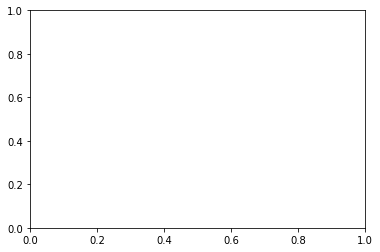

In [29]:
Figure, ax = plt.subplots()
#plot.ylim(0.0,1.0)
ax(df_trial.iloc[:, 1:5])
ax.set_ylim([0.0,1.0])

In [44]:
df_trial.iloc[:, 0]

0    0
1    1
2    2
3    3
4    4
5    5
6    6
7    7
8    8
9    9
Name: Unnamed: 0, dtype: int64

In [30]:
display(df_trial)

,Unnamed: 0,loss,acc,val_loss,val_acc,Kernel,Conv2D,hidden01,epochs,Batch_size
0,0,711.420528,0.473186,0.692919,0.525641,14x8,16.0,10.0,10.0,128.0
1,1,0.692961,0.520505,0.692870,0.525641,14x8,16.0,10.0,10.0,128.0
2,2,0.692941,0.520505,0.692831,0.525641,14x8,16.0,10.0,10.0,128.0
3,3,0.692934,0.520505,0.692762,0.525641,14x8,16.0,10.0,10.0,128.0
4,4,0.692943,0.520505,0.692723,0.525641,NaN,NaN,NaN,NaN,NaN
5,5,0.692834,0.520505,0.692719,0.525641,NaN,NaN,NaN,NaN,NaN
6,6,0.692819,0.520505,0.692707,0.525641,NaN,NaN,NaN,NaN,NaN
7,7,0.692813,0.520505,0.692704,0.525641,NaN,NaN,NaN,NaN,NaN
8,8,0.692804,0.520505,0.692689,0.525641,NaN,NaN,NaN,NaN,NaN
9,9,0.692789,0.520505,0.692669,0.525641,NaN,NaN,NaN,NaN,NaN


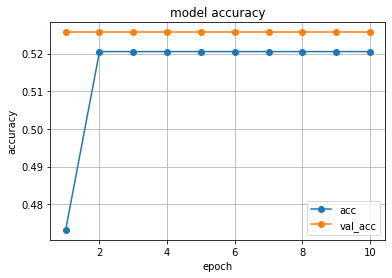

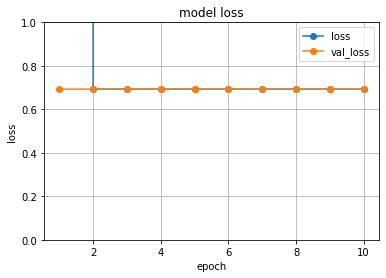

In [31]:
NUM_EPOCHS=len(df_trial)
plt.plot(range(1, NUM_EPOCHS+1), df_trial['acc'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), df_trial['val_acc'], "-o")
plt.title('model accuracy')
plt.ylabel('accuracy')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['acc', 'val_acc'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
#plt.ylim(0.95,1.0)
plt.show()

plt.plot(range(1, NUM_EPOCHS+1), df_trial['loss'], "-o")
plt.plot(range(1, NUM_EPOCHS+1), df_trial['val_loss'], "-o")
plt.title('model loss')
plt.ylabel('loss')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['loss', 'val_loss'], loc='best')
#plt.xlim(0,NUM_EPOCHS)
plt.ylim(0.0,1.0)
plt.show()

In [25]:
df_trial

,Unnamed: 0,loss,acc,val_loss,val_acc
0,0,59.085094,0.485804,0.779741,0.525641
1,1,0.726140,0.555205,0.623042,0.705128
2,2,0.601712,0.684543,0.714354,0.551282
3,3,0.644945,0.646688,0.702965,0.730769
4,4,0.699214,0.586751,0.702622,0.551282
...,...,...,...,...,...
295,295,0.692318,0.520505,0.691902,0.525641
296,296,0.692335,0.520505,0.691896,0.525641
297,297,0.692307,0.520505,0.691895,0.525641
298,298,0.692314,0.520505,0.691896,0.525641


In [26]:
df_trdes = df_trial.describe() 

In [27]:

df_trdes

,Unnamed: 0,loss,acc,val_loss,val_acc
count,300.000000,300.000000,300.000000,300.000000,300.000000
mean,149.500000,0.910406,0.523049,0.694964,0.527265
std,86.746758,3.395373,0.028120,0.055310,0.030796
min,0.000000,0.404453,0.353312,0.556244,0.179487
25%,74.750000,0.692314,0.520505,0.691904,0.525641
50%,149.500000,0.692330,0.520505,0.691918,0.525641
75%,224.250000,0.692396,0.520505,0.692100,0.525641
max,299.000000,59.085094,0.895899,1.633043,0.794872


In [24]:
loss_minimam = []
val_loss_minimam = []
acc_maximam = []
val_acc_maximam = []
for var in range(960):
    filename = f'../predict/DFS_parameter/trial_{var}.csv'
    df_trial = pd.read_csv(filename)
    df_trdes = df_trial.describe() 
    loss_minimam.append(df_trdes.at["min", "loss"])
    val_loss_minimam.append(df_trdes.at["min", "val_loss"])
    acc_maximam.append(df_trdes.at["max", "acc"])
    val_acc_maximam.append(df_trdes.at["max", "val_acc"])
print(val_loss_minimam)
print(val_acc_maximam)

[0.5562435388565063, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6931471824645996, 0.6100110319944528, 0.6928483966069344, 0.6928797960281372, 0.6918870883110242, 0.6919224843000754, 0.6140508651733398, 0.31167281705599564, 0.6013346681228051, 0.3340342342853546, 0.6918771679584796, 0.4406004395240393, 0.6918761134147644, 0.6925548024666615, 0.6933502081112984, 0.6927356719970703, 0.39265593351461947, 0.6919226325475253, 0.633244514465332, 0.4786554926481002, 0.691884479461572, 0.6919252276420593, 0.6394731585796063, 0.3132885702145405, 0.6918730735778809, 0.6923444912983822, 0.6927162531094674, 0.584674060344696, 0.6918895764228625, 0.6919202025120075, 0.6918792128562927, 0.6395233609737494, 0.4627275264415986, 0.6918680667877197, 0.6918799174137604, 0.6918856440446316, 0.69187992811203, 0.6931471824645996, 0.6931471824645996, 0.

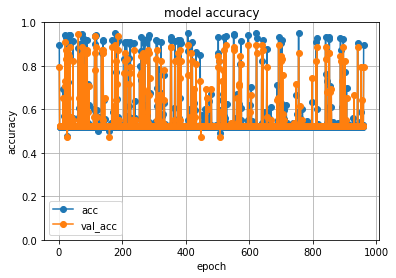

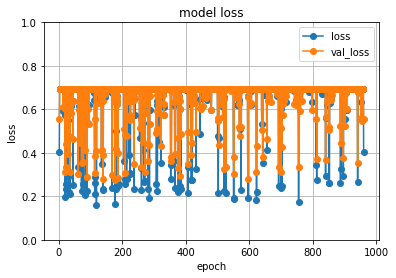

In [32]:
patterns=960
plt.plot(range(1, patterns+1), acc_maximam, "-o")
plt.plot(range(1, patterns+1), val_acc_maximam, "-o")
plt.title('model accuracy')
plt.ylabel('accuracy')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['acc', 'val_acc'], loc='best')
#plt.xlim(0,patterns)
plt.ylim(0.0,1.0)
plt.show()

plt.plot(range(1, patterns+1), loss_minimam, "-o")
plt.plot(range(1, patterns+1), val_loss_minimam, "-o")
plt.title('model loss')
plt.ylabel('loss')  # Y軸ラベル
plt.xlabel('epoch')  # X軸ラベル
plt.grid()
plt.legend(['loss', 'val_loss'], loc='best')
#plt.xlim(0,patterns)
plt.ylim(0.0,1.0)
plt.show()